# Indian FoodVision Large(100%)

---



This version uses 100% images of each class from the Khana data paper in order to train model with the same settings as trained on 50% data's best performing model.

Dataset link:- https://huggingface.co/datasets/shuraimi/

Zip file link:- https://huggingface.co/datasets/shuraimi/khana_full_data/resolve/main/khana_100%25train_test_split.zip

The best performing model of the previous experiment(50% data) was:-
- I **got great results** with MobileNetV3 model trained for 15 epochs using loss function `FocalLoss` and lr scheduler `CosineAnnealing`


***What was new in this notebook?***
> -


**I'm gonna try these experiments on 100% data**
- Same setting as before which was done on 50% data lr scheduler ✅


**Next step** is :-

## Imports

In [1]:
# library for all dl functions
import torch

# import torchvision
import torchvision

from torchvision import datasets,transforms

import random

## Get data

In [2]:
from pathlib import Path

In [ ]:
from pathlib import Path
import requests
from zipfile import ZipFile

# create datapath and image paths
data_path=Path('data')
image_path=Path(f'{data_path}/khana_100')

if image_path.is_dir():
    print(f'The given path {image_path} is already a directory')
else:
    print(f'The directory doesn\'t exist\nCreating one...')
    image_path.mkdir(exist_ok=True,parents=True)

    # get the zip file from the link and then unzip it

    # getting the file
    with open(image_path/'khana_subset_100%img_all_classes.zip','wb') as f:
        print(f'Getting the data aka Downloading it...')
        request=requests.get('https://huggingface.co/datasets/shuraimi/khana_full_data/resolve/main/khana_100%25train_test_split.zip')
        f.write(request.content)

    with ZipFile(image_path/'khana_subset_100%img_all_classes.zip','r') as zip_ref:
        print(f'Unzipping the data')
        zip_ref.extractall(image_path)

The given path data/khana_100 is already a directory


## Set up device agnoistic code

In [ ]:
device='cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

## Removing corrupted files likely MAC generated files

In [23]:
# from PIL import Image, UnidentifiedImageError
# import os

# root = "data/khana_100/khana_100%train_test_split"

# folders_to_check = ["train", "test"]

# removed_count = 0
# checked_count = 0

# for folder in folders_to_check:
#     folder_path = os.path.join(root, folder)

#     print(f"\nChecking folder: {folder_path}")

#     for path, _, files in os.walk(folder_path):
#         for f in files:
#             fp = os.path.join(path, f)
#             checked_count += 1

#             # Skip non-image files
#             if not f.lower().endswith((".jpg", ".jpeg", ".png", ".bmp", ".webp")):
#                 continue

#             try:
#                 img = Image.open(fp)
#                 img.verify()
#             except (UnidentifiedImageError, OSError, IOError):
#                 print("Removing corrupted or invalid file:", fp)
#                 os.remove(fp)
#                 removed_count += 1

# print("\n---------------------------")
# print("Total files checked :", checked_count)
# print("Total files removed :", removed_count)
# print("---------------------------")



Checking folder: data/khana_100/khana_100%train_test_split/train
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._858e6a4acece6e6a488606d96b3ea0f4.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._frx5vgh28ezpm1dimrzt.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._l7i24bhllujg8dxysc0p.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._oehpfcs4g6vocgykhber.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._permwdmruu8zee7t8os5.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._itr6xpvp3kmbafnb0xyt.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/train/rasgulla/._er7qb545wlc0o9iwynv0.jpg
Removing corrupted or invalid file: data/khana_100/khana_100%train_test_split/trai

## Visualise data

Here I'm gonna plot random images from the whole dataset.

- take all image paths using `path.glob()`
- pick a few random image paths from it say 5 or 10 using `random.sample()`
- plot the images as subplots

In [5]:
all_image_paths=Path('data/khana_100/khana_100%train_test_split/train')

In [6]:
# get list of all the image paths from this path
all_image_paths_list=list(all_image_paths.glob('*/*.jpg'))

In [7]:
len(all_image_paths_list)

105450

In [8]:
# get a random sample of 10 images
rand_image_paths=random.sample(all_image_paths_list,k=10)

In [4]:
import matplotlib.pyplot as plt
from PIL import Image

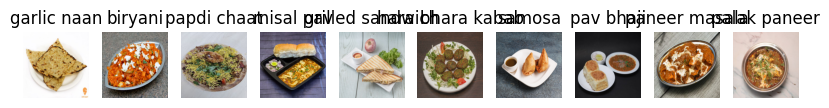

In [10]:
# plot the images
fig,ax=plt.subplots(nrows=1,
                    ncols=10,
                    figsize=(10,7))

for i,img_path in enumerate(rand_image_paths):
    img=Image.open(img_path)
    ax[i].imshow(img)
    ax[i].axis('off')
    ax[i].set_title(img_path.parent.stem)

## Create dataset using `ImageFolder()`

In [5]:
path=Path('data/khana_100/khana_100%train_test_split')
path

PosixPath('data/khana_100/khana_100%train_test_split')

In [6]:
# specfy train and test paths
train_dir=path/'train'
test_dir=path/'test'

In [7]:
train_dir

PosixPath('data/khana_100/khana_100%train_test_split/train')

### Get transforms from pretrained model as test transforms

In [8]:
weights=torchvision.models.MobileNet_V3_Large_Weights.DEFAULT
transforms_mob_test=weights.transforms()
transforms_mob_test

ImageClassification(
    crop_size=[224]
    resize_size=[232]
    mean=[0.485, 0.456, 0.406]
    std=[0.229, 0.224, 0.225]
    interpolation=InterpolationMode.BILINEAR
)

In [9]:
from torchvision.transforms import v2
transforms_da_train=v2.Compose(
    [
       v2.RandomResizedCrop((224,224)),
       v2.RandomHorizontalFlip(p=0.5),
       v2.RandomRotation(degrees=20),
       v2.ColorJitter(brightness=0.2,contrast=0.2,saturation=0.2),
       v2.RandomErasing(),
       v2.ToTensor(),
       v2.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ]
)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/torchvision/transforms/v2/_deprecated.py:42: UserWarning: The transform `ToTensor()` is deprecated and will be removed in a future release. Instead, please use `v2.Compose([v2.ToImage(), v2.ToDtype(torch.float32, scale=True)])`.Output is equivalent up to float precision.
  warnings.warn(


In [10]:
from torchvision.transforms import v2

transforms_da_train = v2.Compose([
    v2.ToImage(),                    # <— FIX: converts to RGB automatically
    v2.ToDtype(torch.float32, scale=True),

    v2.RandomResizedCrop((224, 224)),
    v2.RandomHorizontalFlip(p=0.5),
    v2.RandomRotation(degrees=20),
    v2.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    v2.RandomErasing(),

    v2.Normalize(mean=[0.485, 0.456, 0.406],
                 std=[0.229, 0.224, 0.225]),
])


🎯 Why this Works
✔ v2.ToImage()

Automatically converts:

palette “P” images

PNG transparency

GIF frames

1-channel greyscale

into clean RGB uint8 images.
This removes the warning entirely.

✔ ToDtype(scale=True)

Replaces ToTensor() in v2:

converts to float32

scales 0–255 → 0–1

no warnings

faster

In [18]:
transforms_da_train

Compose(
      ToImage()
      ToDtype(scale=True)
      RandomResizedCrop(size=(224, 224), scale=(0.08, 1.0), ratio=(0.75, 1.3333333333333333), interpolation=InterpolationMode.BILINEAR, antialias=True)
      RandomHorizontalFlip(p=0.5)
      RandomRotation(degrees=[-20.0, 20.0], interpolation=InterpolationMode.NEAREST, expand=False, fill=0)
      ColorJitter(brightness=(0.8, 1.2), contrast=(0.8, 1.2), saturation=(0.8, 1.2))
      RandomErasing(p=0.5, scale=(0.02, 0.33), ratio=(0.3, 3.3), value=[0.0], inplace=False)
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225], inplace=False)
)

In [11]:
train_data=datasets.ImageFolder(root=train_dir,
                                transform=transforms_da_train)
test_data=datasets.ImageFolder(root=test_dir,
                               transform=transforms_mob_test)

In [12]:
class_names=train_data.classes
class_names

['aloo gobi',
 'aloo methi',
 'aloo mutter',
 'aloo paratha',
 'amritsari kulcha',
 'anda curry',
 'balushahi',
 'banana chips',
 'besan laddu',
 'bhindi masala',
 'biryani',
 'boondi laddu',
 'chaas',
 'chana masala',
 'chapati',
 'chicken pizza',
 'chicken wings',
 'chikki',
 'chivda',
 'chole bhature',
 'dabeli',
 'dal khichdi',
 'dhokla',
 'falooda',
 'fish curry',
 'gajar ka halwa',
 'garlic bread',
 'garlic naan',
 'ghevar',
 'grilled sandwich',
 'gujhia',
 'gulab jamun',
 'hara bhara kabab',
 'idiyappam',
 'idli',
 'jalebi',
 'kaju katli',
 'khakhra',
 'kheer',
 'kulfi',
 'margherita pizza',
 'masala dosa',
 'masala papad',
 'medu vada',
 'misal pav',
 'modak',
 'moong dal halwa',
 'murukku',
 'mysore pak',
 'navratan korma',
 'neer dosa',
 'onion pakoda',
 'palak paneer',
 'paneer masala',
 'paneer pizza',
 'pani puri',
 'paniyaram',
 'papdi chaat',
 'patrode',
 'pav bhaji',
 'pepperoni pizza',
 'phirni',
 'poha',
 'pongal',
 'puri bhaji',
 'rajma chawal',
 'rasgulla',
 'rava d

In [13]:
len(class_names)

80

## Create `DataLoaders`

In [14]:
import os
from PIL import ImageFile

ImageFile.LOAD_TRUNCATED_IMAGES = True

In [15]:
BATCH_SIZE=64
NUM_WORKERS=os.cpu_count()
train_dl=torch.utils.data.dataloader.DataLoader(dataset=train_data,
                                                batch_size=BATCH_SIZE,
                                                shuffle=True,
                                                num_workers=NUM_WORKERS,
                                                pin_memory=True)
test_dl=torch.utils.data.dataloader.DataLoader(dataset=test_data,
                                               batch_size=BATCH_SIZE,
                                               shuffle=False,
                                               num_workers=NUM_WORKERS,
                                               pin_memory=True)

In [16]:
len(train_dl),len(test_dl)

(1648, 413)

### Plot images in DataLoader

In [25]:
image_batch,label_batch=next(iter(train_dl))

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


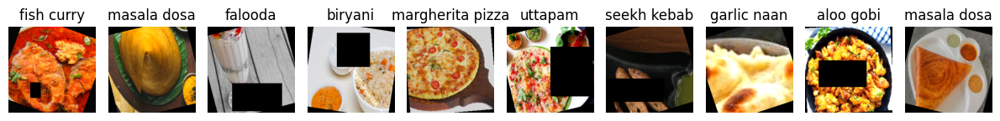

In [26]:
# Helper function to denormalize images for plotting
def denormalize_image(image_tensor, mean, std):
    for t, m, s in zip(image_tensor, mean, std):
        t.mul_(s).add_(m)
    return image_tensor

fig,ax=plt.subplots(nrows=1,
                    ncols=10,
                    figsize=(12,10)
                    )

# Define mean and std from the transforms used
# These are typically [0.485, 0.456, 0.406] and [0.229, 0.224, 0.225]
# from ImageClassification transform or transforms_da
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

for i,img in enumerate(image_batch):
    if i < 10: # Only plot the first 10 images to fit the subplots
        # Denormalize the image before plotting
        denormalized_img = denormalize_image(img.clone(), mean, std)
        ax[i].imshow(denormalized_img.permute(1,2,0)) # Changed to (H,W,C) format for imshow
        ax[i].set_title(class_names[label_batch[i]])
        ax[i].axis('off')
plt.tight_layout()

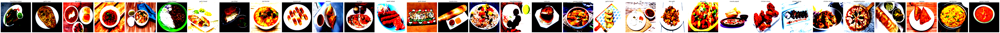

In [ ]:
# fig, ax = plt.subplots(
#     nrows=1,
#     ncols=10,
#     figsize=(4 * BATCH_SIZE, 6)   # increase per-image width & height
# )

# for i, img in enumerate(image_batch):
#     ax[i].imshow(img.permute(1,2,0))   # fixed permute too (HWC)
#     ax[i].set_title(class_names[label_batch[i]], fontsize=12)
#     ax[i].axis('off')

# plt.tight_layout()

# plt.show()



The images in a batch can also be plotted using `torch.utils.make_grid()`

### Get summary of model using `summary()` from `torchinfo`

In [ ]:
!pip install torchinfo

In [ ]:
from torchinfo import summary

### Train function

In [17]:
# function for train step
def train_step(model,train_dataloader,loss_fn,optimizer):
    """
    This function takes in a model, a DataLoader, a loss function and an optimizer and trains the model on the DataLoader.
    It then returns the train loss and train accuracy.

    """

    # training loop

    # put model in train mode
    model.train()

    # to store train loss and acc values
    train_loss,train_acc=0,0

    # iterate through the batches train_dl
    for batch,(X,y) in enumerate(train_dataloader):

        # send data to device
        X,y=X.to(device),y.to(device)

        # 1. get preds
        y_preds=model(X)

        # 2. calculate the loss
        loss=loss_fn(y_preds,y)
        train_loss+=loss.item()

        # 3. optimizer zero grads
        optimizer.zero_grad()

        # 4. loss.backwards
        loss.backward()

        # 5. step the optimizer
        optimizer.step()

        # get accuracy and acculumate the accuracy metric across all batches
        y_pred_labels=torch.softmax(y_preds,dim=1).argmax(dim=1)

        acc=(y_pred_labels==y).sum().item()/len(y_preds)
        train_acc+=acc

    # normalize the train loss and train acc by dividing them by the len(train_dl)
    train_loss/=len(train_dataloader)
    train_acc/=len(train_dataloader)

    return train_loss,train_acc

### Test function

In [18]:
def test_step(model,test_dataloader,loss_fn):
    """
    This test function takes in a model, a DataLoader and loss function and evaluates the model on the DataLoader.
    """
    # testing loop

    # put model in eval mode
    model.eval()

    test_loss,test_acc=0,0

    with torch.inference_mode():

        # loop through the test_dataloader
        for X,y in test_dataloader:

            # put data to device
            X,y=X.to(device),y.to(device)

            # get preds
            y_preds=model(X)

            # calculate the loss
            loss=loss_fn(y_preds,y)
            # accumulate the loss
            test_loss+=loss.item()

            # convert preds i.e logits to pred probabilities
            y_pred_probs=torch.softmax(y_preds,dim=1)

            # now get labels
            y_pred_labels=torch.argmax(y_pred_probs,dim=1)

            # get accuracy
            acc=(y_pred_labels==y).sum().item()/len(y_preds)
            test_acc+=acc

    # divide test loss and acc by len(test_dl)
    test_loss/=len(test_dataloader)
    test_acc/=len(test_dataloader)

    return test_loss,test_acc

### Train function

In [19]:
# now create a train function which inlcudes train and test step functions
def train(model,train_dataloader,test_dataloader,loss_fn,optimizer,epochs):
    """
    This takes in a model, a DataLoader for the training and test step functions, loss function, optimizer and epochs
    """

    # create results dict to store the train and test loss and accuracy after each epoch updating it during training
    results={
        'train_loss':[],
        'train_acc':[],
        'test_loss':[],
        'test_acc':[]
    }

    for epoch in range(epochs):

        train_loss,train_acc=train_step(model=model,
                                        train_dataloader=train_dataloader,
                                        loss_fn=loss_fn,
                                        optimizer=optimizer)

        test_loss,test_acc=test_step(model=model,
                                     test_dataloader=test_dataloader,
                                     loss_fn=loss_fn)
        gap=test_loss-train_loss

        # printing what's happening after each epoch
        print(f'[INFO] Epoch: {epoch+1} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | test_loss: {test_loss:.4f} | test_acc: {test_acc:.4f} | Gap: {gap:.4f}')
        if gap>0.3:
            print(f'Severe overfitting')
        elif gap>0.15:
            print(f'Moderate Overfitting')
        else:
            print('OK 🆗')
        # update the results dict with apt values
        results['train_loss'].append(train_loss.item() if isinstance(train_loss,torch.Tensor) else train_loss)
        results['train_acc'].append(train_acc.item() if isinstance(train_acc,torch.Tensor) else train_acc)
        results['test_loss'].append(test_loss.item() if isinstance(test_loss,torch.Tensor) else test_loss)
        results['test_acc'].append(test_acc.item() if isinstance(test_acc,torch.Tensor) else test_acc)

    return results





### Plot loss curves function

In [20]:
def plot_loss_curves(results):
    """
    This function takes a results dictionary which contains train_loss, train_acc, test_loss, test_acc key and respective lists as values
    """

    # get respective values from the results dictionary
    train_loss=results['train_loss']
    train_acc=results['train_acc']
    test_loss=results['test_loss']
    test_acc=results['test_acc']

    epochs=list(range(len(train_loss)))

    fig,ax=plt.subplots(nrows=1,
                        ncols=2,
                        figsize=(12,7))
    # plot train loss and test loss
    ax[0].plot(epochs,train_loss,label='Train loss')
    ax[0].plot(epochs,test_loss,label='Test loss')
    ax[0].legend(loc='best')
    ax[0].set_title('Loss')
    ax[0].set_xlabel('Epochs')

    # plot accuracy
    ax[1].plot(epochs,train_acc,label='Train acc')
    ax[1].plot(epochs,test_acc,label='Test acc')
    ax[1].legend(loc='best')
    ax[1].set_title('Accuracy')
    ax[1].set_xlabel('Epochs');

### EarlyStopping Code

In [21]:
class EarlyStopping:
    def __init__(self,patience=5,min_delta=0,checkpoint_path='best.pt'):
        self.patience=patience
        self.min_delta=min_delta
        self.checkpoint_path=checkpoint_path
        self.best_score=None
        self.counter=0
        self.early_stop=False
    def __call__(self,val_loss,model):

        # first run val_loss is the best score
        score=-val_loss
        if self.best_score is None:
            self.best_score=score
            self.save_checkpoint(val_loss,model)

        # if no improvement
        elif score<self.best_score+self.min_delta:
            self.counter+=1
            if self.counter>=self.patience:
                self.early_stop=True
        else:
            self.best_score=score
            self.save_checkpoint(val_loss,model)
            self.counter=0
    def save_checkpoint(self,val_loss,model):
        torch.save(model.state_dict(),self.checkpoint_path)

In [22]:
from torch import nn

In [23]:
# create model function
def create_mobile_net_v3():

    # get weights
    weights_mob=torchvision.models.MobileNet_V3_Large_Weights.DEFAULT

    # create model
    model_mob=torchvision.models.mobilenet_v3_large(weights=weights_mob).to(device)

    # freeze base layers
    for param in model_mob.features.parameters():
        param.requires_grad=False

    # change head
    model_mob.classifier=model_mob.classifier=nn.Sequential(
    nn.Linear(in_features=960, out_features=1280, bias=True),
    nn.Hardswish(),
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280, out_features=len(class_names), bias=True)
    ).to(device)

    model_mob.name='mobile_net_v3'
    print(f'[INFO] Created new model {model_mob.name} model')
    return model_mob

## Train model for 5 epochs

No lr

In [24]:
import torch.nn.functional as F

class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2.0, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, inputs, targets):
        BCE_loss = F.cross_entropy(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss)
        focal_loss = self.alpha * (1 - pt)**self.gamma * BCE_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss

In [25]:
model=create_mobile_net_v3()

[INFO] Created new model mobile_net_v3 model


In [26]:
loss_fn=FocalLoss(alpha=0.25, gamma=2.0)
optimizer=torch.optim.AdamW(model.parameters(),lr=3e-3,weight_decay=0.0001)

In [27]:
epochs=5

results_lr=train(model=model,
              train_dataloader=train_dl,
              test_dataloader=test_dl,
              loss_fn=loss_fn,
              optimizer=optimizer,
              epochs=epochs)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 1 | train_loss: 0.3443 | train_acc: 0.5408 | test_loss: 0.2333 | test_acc: 0.6477 | Gap: -0.1111
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 2 | train_loss: 0.3009 | train_acc: 0.5827 | test_loss: 0.2178 | test_acc: 0.6679 | Gap: -0.0831
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 3 | train_loss: 0.2872 | train_acc: 0.5996 | test_loss: 0.2131 | test_acc: 0.6693 | Gap: -0.0741
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 4 | train_loss: 0.2821 | train_acc: 0.6032 | test_loss: 0.2078 | test_acc: 0.6843 | Gap: -0.0743
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 5 | train_loss: 0.2797 | train_acc: 0.6069 | test_loss: 0.2124 | test_acc: 0.6735 | Gap: -0.0674
OK 🆗


In [28]:
import matplotlib.pyplot as plt

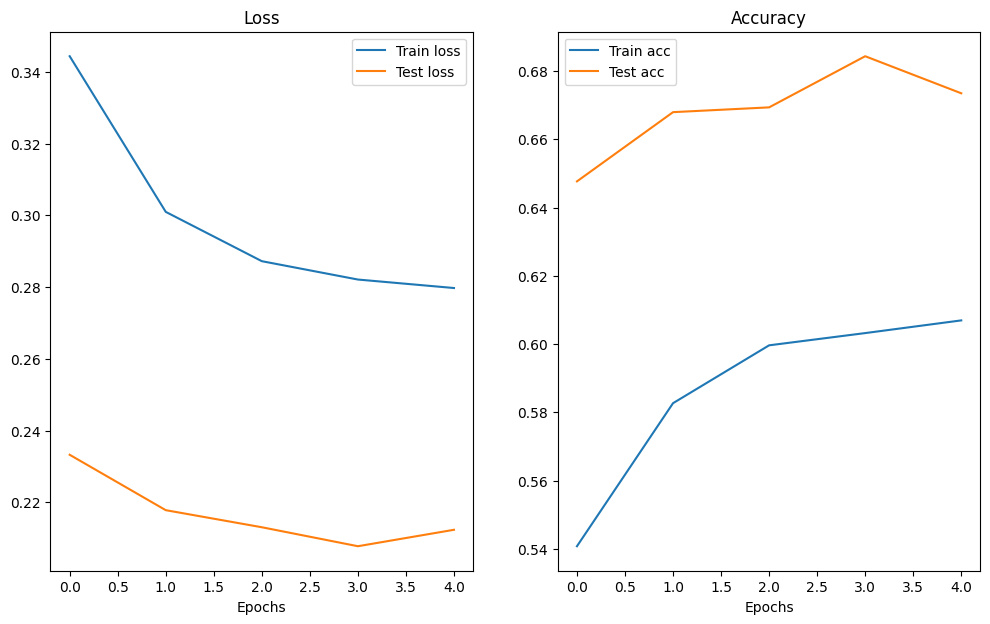

In [29]:
plot_loss_curves(results_lr)

## Train model using OneCycleLR

In [30]:
from torch import nn

In [31]:
# model_5=create_mobile_net_v3()

In [ ]:
# loss_fn=nn.CrossEntropyLoss()
# optimizer=torch.optim.AdamW(model_5.parameters(),lr=0.001,weight_decay=0.0001)

In [32]:
loss_fn=FocalLoss(alpha=0.25, gamma=2.0)
optimizer=torch.optim.AdamW(model.parameters(),lr=1e-4,weight_decay=0.0001)

In [39]:
# # lr scheduler
# scheduler_3=torch.optim.lr_scheduler.CosineAnnealingLR(optimizer,T_max=15,last_epoch=-1,eta_min=1e-6)


In [34]:
epochs=20

In [36]:
scheduler = torch.optim.lr_scheduler.OneCycleLR(
    optimizer,
    max_lr=1e-3,
    steps_per_epoch=len(train_dl),
    epochs=epochs,
    pct_start=0.2,
    div_factor=10,
    final_div_factor=1000
)

In [37]:
# function for train step
def train_step(model,train_dataloader,loss_fn,optimizer,scheduler):
    """
    This function takes in a model, a DataLoader, a loss function and an optimizer and trains the model on the DataLoader.
    It then returns the train loss and train accuracy.

    """

    # training loop

    # put model in train mode
    model.train()

    # to store train loss and acc values
    train_loss,train_acc=0,0

    # iterate through the batches train_dl
    for batch,(X,y) in enumerate(train_dataloader):

        # send data to device
        X,y=X.to(device),y.to(device)

        # 1. get preds
        y_preds=model(X)

        # 2. calculate the loss
        loss=loss_fn(y_preds,y)
        train_loss+=loss.item()

        # 3. optimizer zero grads
        optimizer.zero_grad()

        # 4. loss.backwards
        loss.backward()

        # 5. step the optimizer
        optimizer.step()

        # schduler step
        scheduler.step()

        # get accuracy and acculumate the accuracy metric across all batches
        y_pred_labels=torch.softmax(y_preds,dim=1).argmax(dim=1)

        acc=(y_pred_labels==y).sum().item()/len(y_preds)
        train_acc+=acc

    # normalize the train loss and train acc by dividing them by the len(train_dl)
    train_loss/=len(train_dataloader)
    train_acc/=len(train_dataloader)

    return train_loss,train_acc

In [38]:
# now create a train function which inlcudes train and test step functions
def train(model,train_dataloader,test_dataloader,loss_fn,optimizer,epochs,scheduler):
    """
    This takes in a model, a DataLoader for the training and test step functions, loss function, optimizer and epochs
    """

    # create results dict to store the train and test loss and accuracy after each epoch updating it during training
    results={
        'train_loss':[],
        'train_acc':[],
        'test_loss':[],
        'test_acc':[]
    }

    for epoch in range(epochs):

        train_loss,train_acc=train_step(model=model,
                                        train_dataloader=train_dataloader,
                                        loss_fn=loss_fn,
                                        optimizer=optimizer,
                                        scheduler=scheduler)

        test_loss,test_acc=test_step(model=model,
                                     test_dataloader=test_dataloader,
                                     loss_fn=loss_fn)
        gap=test_loss-train_loss

        # printing what's happening after each epoch
        print(f'[INFO] Epoch: {epoch+1} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.4f} | test_loss: {test_loss:.4f} | test_acc: {test_acc:.4f} | Gap: {gap:.4f}')
        if gap>0.3:
            print(f'Severe overfitting')
        elif gap>0.15:
            print(f'Moderate Overfitting')
        else:
            print('OK 🆗')
        # update the results dict with apt values
        results['train_loss'].append(train_loss.item() if isinstance(train_loss,torch.Tensor) else train_loss)
        results['train_acc'].append(train_acc.item() if isinstance(train_acc,torch.Tensor) else train_acc)
        results['test_loss'].append(test_loss.item() if isinstance(test_loss,torch.Tensor) else test_loss)
        results['test_acc'].append(test_acc.item() if isinstance(test_acc,torch.Tensor) else test_acc)

    return results





In [39]:
# unfreezing function
def unfreeze_last_layers(model, num_layers):
    # Unfreeze the last N blocks in MobileNetV3
    for block in model.features[-num_layers:]:
        for p in block.parameters():
            p.requires_grad = True


In [40]:
# Phase 2 → unfreeze last 3 blocks
unfreeze_last_layers(model, 3)

In [41]:
epochs=epochs

results_lr=train(model=model,
              train_dataloader=train_dl,
              test_dataloader=test_dl,
              loss_fn=loss_fn,
              optimizer=optimizer,
              epochs=epochs,
              scheduler=scheduler)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 1 | train_loss: 0.2059 | train_acc: 0.6918 | test_loss: 0.1274 | test_acc: 0.7840 | Gap: -0.0784
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 2 | train_loss: 0.1685 | train_acc: 0.7331 | test_loss: 0.1092 | test_acc: 0.8081 | Gap: -0.0593
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 3 | train_loss: 0.1549 | train_acc: 0.7485 | test_loss: 0.1014 | test_acc: 0.8179 | Gap: -0.0535
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 4 | train_loss: 0.1467 | train_acc: 0.7598 | test_loss: 0.0941 | test_acc: 0.8273 | Gap: -0.0526
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 5 | train_loss: 0.1349 | train_acc: 0.7738 | test_loss: 0.0841 | test_acc: 0.8427 | Gap: -0.0508
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 6 | train_loss: 0.1259 | train_acc: 0.7856 | test_loss: 0.0819 | test_acc: 0.8474 | Gap: -0.0440
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 7 | train_loss: 0.1168 | train_acc: 0.7977 | test_loss: 0.0762 | test_acc: 0.8556 | Gap: -0.0406
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 8 | train_loss: 0.1094 | train_acc: 0.8062 | test_loss: 0.0748 | test_acc: 0.8623 | Gap: -0.0346
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 9 | train_loss: 0.1052 | train_acc: 0.8130 | test_loss: 0.0710 | test_acc: 0.8664 | Gap: -0.0342
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 10 | train_loss: 0.0987 | train_acc: 0.8228 | test_loss: 0.0682 | test_acc: 0.8674 | Gap: -0.0305
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 11 | train_loss: 0.0922 | train_acc: 0.8319 | test_loss: 0.0668 | test_acc: 0.8741 | Gap: -0.0254
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 12 | train_loss: 0.0873 | train_acc: 0.8393 | test_loss: 0.0632 | test_acc: 0.8792 | Gap: -0.0241
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 13 | train_loss: 0.0825 | train_acc: 0.8459 | test_loss: 0.0606 | test_acc: 0.8856 | Gap: -0.0218
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 14 | train_loss: 0.0778 | train_acc: 0.8539 | test_loss: 0.0594 | test_acc: 0.8875 | Gap: -0.0184
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 15 | train_loss: 0.0739 | train_acc: 0.8575 | test_loss: 0.0580 | test_acc: 0.8881 | Gap: -0.0159
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

KeyboardInterrupt: 

### Save model function

In [42]:
from pathlib import Path
def save_model(model,
               target_dir,
               model_name):

    """
    Save model given model, target directory and model_name
    """
    # create target_dir
    target_dir_path=Path(target_dir)
    target_dir_path.mkdir(parents=True,exist_ok=True)

    # assert where model name contains .pt or .pth
    assert model_name.endswith('.pt') or model_name.endswith('.pth'), "Model name should end with '.pt' or '.pth'"
    # create model save path
    model_save_path=target_dir_path/model_name

    print(f'[INFO] Saving model to {model_save_path}')
    # save the model
    torch.save(obj=model.state_dict(),
                      f=model_save_path) # no need to return


In [ ]:
# save model after 15 epochs training
save_model(model=model,
target_dir='models',
model_name='MobileNetV3_100_data_15_epochs_test_acc88_with_unfreezing_3_layers.pth'
)

[INFO] Saving model to models/MobileNetV3_100_data_15_epochs_test_acc88_with_unfreezing_3_layers.pth


In [44]:
import matplotlib.pyplot as plt


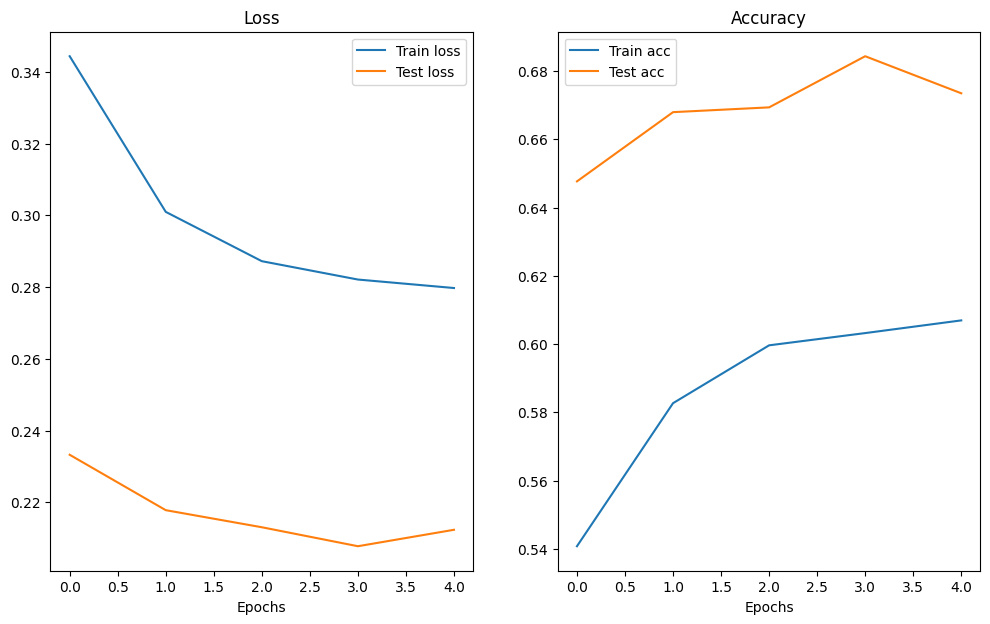

In [ ]:
plot_loss_curves(results_lr)

**Observation**:-

I got the 77% test acc results using this `CosineAnnealing` and the best loss and accuracy scores both train and test losses.

Therfore training the model for few more epochs by changing lr scheduler

In [46]:
results_lr

{'train_loss': [0.34432630130605213,
  0.3009495283341379,
  0.2872100189346278,
  0.2820943353552986,
  0.2797306692046882],
 'train_acc': [0.540799363586454,
  0.5826962877080444,
  0.5996441393608414,
  0.6032271259535368,
  0.6069433006819233],
 'test_loss': [0.23326307510648184,
  0.21782451208365508,
  0.21306539809931133,
  0.20777851034353048,
  0.21235924314057228],
 'test_acc': [0.6476619249394673,
  0.6679403753026635,
  0.6693401937046005,
  0.684322033898305,
  0.6734639830508474]}

### Plot Confusion Matrix

In [47]:
# get all preds
y_preds,y_actual=[],[]
model.eval()
with torch.inference_mode():
    for X,y in test_dl:
        X,y=X.to(device),y.to(device)
        y_pred=model(X)
        y_label=torch.softmax(y_pred,dim=1).argmax(dim=1)
        y_preds.append(y_label.cpu())
        y_actual.append(y.cpu())
y_preds_ten=torch.cat(y_preds)
y_actual_ten=torch.cat(y_actual)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

In [48]:
# pip install torchmetrics and mlxtend
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")

mlxtend version: 0.23.4


In [49]:
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix

conf_mat=ConfusionMatrix(task='multiclass',num_classes=len(class_names))

In [50]:
confmat_tensor=conf_mat(preds=y_preds_ten,
                        target=y_actual_ten)

(<Figure size 4000x4000 with 2 Axes>,
 <Axes: xlabel='predicted label', ylabel='true label'>)

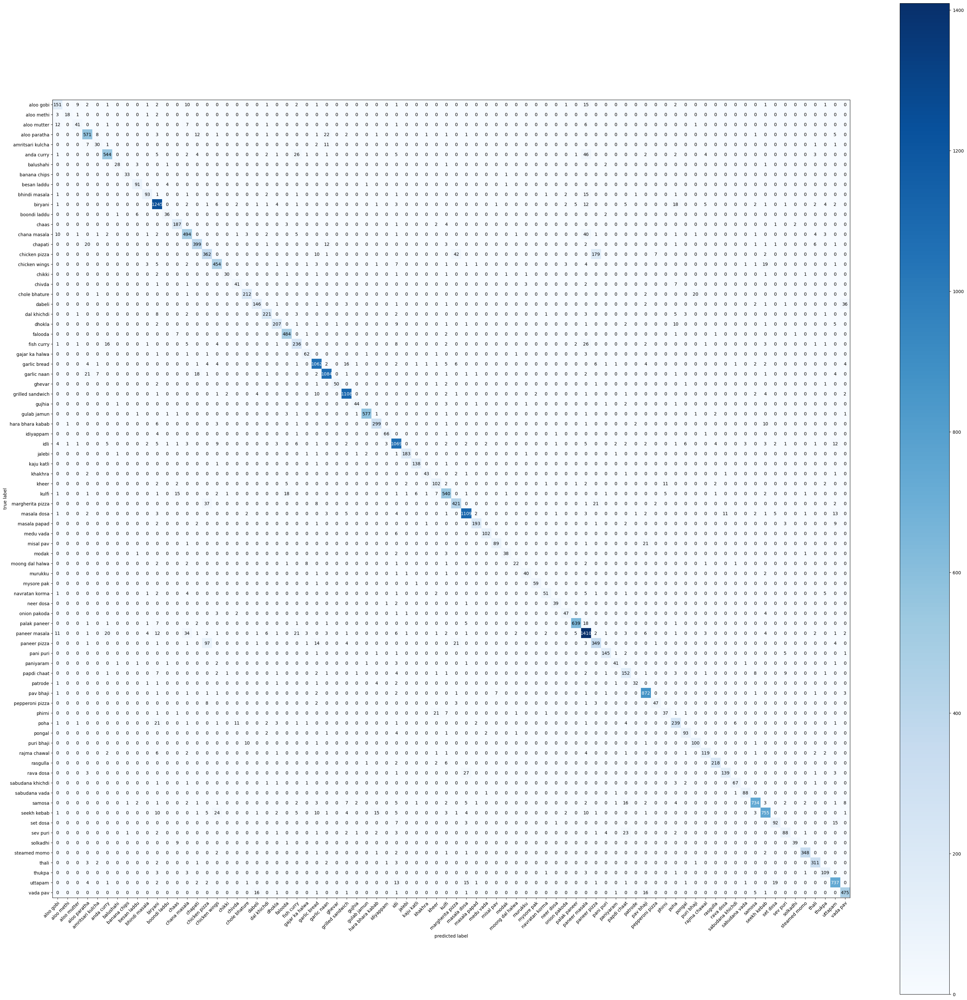

In [51]:
# display the matrix
plot_confusion_matrix(conf_mat=confmat_tensor.numpy(),
                      class_names=class_names,
                      figsize=(40,40), # Increased figsize for better visibility with many classes
                      colorbar=True) # Added colorbar for better interpretability

In [52]:
from torchmetrics import F1Score



In [53]:
f1_score_macro=F1Score(task='multiclass',
                 num_classes=len(class_names),average='macro')
f1_score_micro=F1Score(task='multiclass',
                 num_classes=len(class_names))

In [54]:
score_macro=f1_score_macro(preds=y_preds_ten,
               target=y_actual_ten)
score_micro=f1_score_micro(preds=y_preds_ten,
               target=y_actual_ten)

In [55]:
print(f'The macro F1 score is {score_macro}')
print(f'The micro F1 score is {score_micro}')

The macro F1 score is 0.8552485704421997
The micro F1 score is 0.8899086117744446


Before changing test transform 
The macro F1 score is 0.8507969379425049
The micro F1 score is 0.8830444812774658

## Train for another 5 epochs and check macro F1 score

In [56]:
epochs=5

results_after_15=train(model=model,
              train_dataloader=train_dl,
              test_dataloader=test_dl,
              loss_fn=loss_fn,
              optimizer=optimizer,
              epochs=epochs,
              scheduler=scheduler)

/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 1 | train_loss: 0.0702 | train_acc: 0.8639 | test_loss: 0.0569 | test_acc: 0.8910 | Gap: -0.0133
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 2 | train_loss: 0.0683 | train_acc: 0.8687 | test_loss: 0.0570 | test_acc: 0.8924 | Gap: -0.0112
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 3 | train_loss: 0.0660 | train_acc: 0.8708 | test_loss: 0.0562 | test_acc: 0.8932 | Gap: -0.0098
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

[INFO] Epoch: 4 | train_loss: 0.0654 | train_acc: 0.8718 | test_loss: 0.0562 | test_acc: 0.8941 | Gap: -0.0093
OK 🆗


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

ValueError: Tried to step 32961 times. The specified number of total steps is 32960

In [ ]:
plot_loss_curves(results_after_15)

NameError: name 'results_after_15' is not defined

In [59]:
# save model after 15 epochs training
save_model(model=model,
target_dir='models',
model_name='MobileNetV3_100_data_15_epochs_test_acc89_with_unfreezing_3_layers_4_extra_epochs.pth'
)

[INFO] Saving model to models/MobileNetV3_100_data_15_epochs_test_acc89_with_unfreezing_3_layers_4_extra_epochs.pth


In [58]:
### Plot Confusion Matrix
# get all preds
y_preds,y_actual=[],[]
model.eval()
with torch.inference_mode():
    for X,y in test_dl:
        X,y=X.to(device),y.to(device)
        y_pred=model(X)
        y_label=torch.softmax(y_pred,dim=1).argmax(dim=1)
        y_preds.append(y_label.cpu())
        y_actual.append(y.cpu())
y_preds_ten=torch.cat(y_preds)
y_actual_ten=torch.cat(y_actual)


/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(
/home/zeus/miniconda3/envs/cloudspace/lib/python3.12/site-packages/PIL/Image.py:1056: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  

In [60]:
# pip install torchmetrics and mlxtend
# See if torchmetrics exists, if not, install it
try:
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
    assert int(mlxtend.__version__.split(".")[1]) >= 19, "mlxtend verison should be 0.19.0 or higher"
except:
    !pip install -q torchmetrics -U mlxtend # <- Note: If you're using Google Colab, this may require restarting the runtime
    import torchmetrics, mlxtend
    print(f"mlxtend version: {mlxtend.__version__}")
from torchmetrics import ConfusionMatrix
from mlxtend.plotting import plot_confusion_matrix


mlxtend version: 0.23.4


(<Figure size 4000x4000 with 2 Axes>,
 <Axes: xlabel='predicted label', ylabel='true label'>)

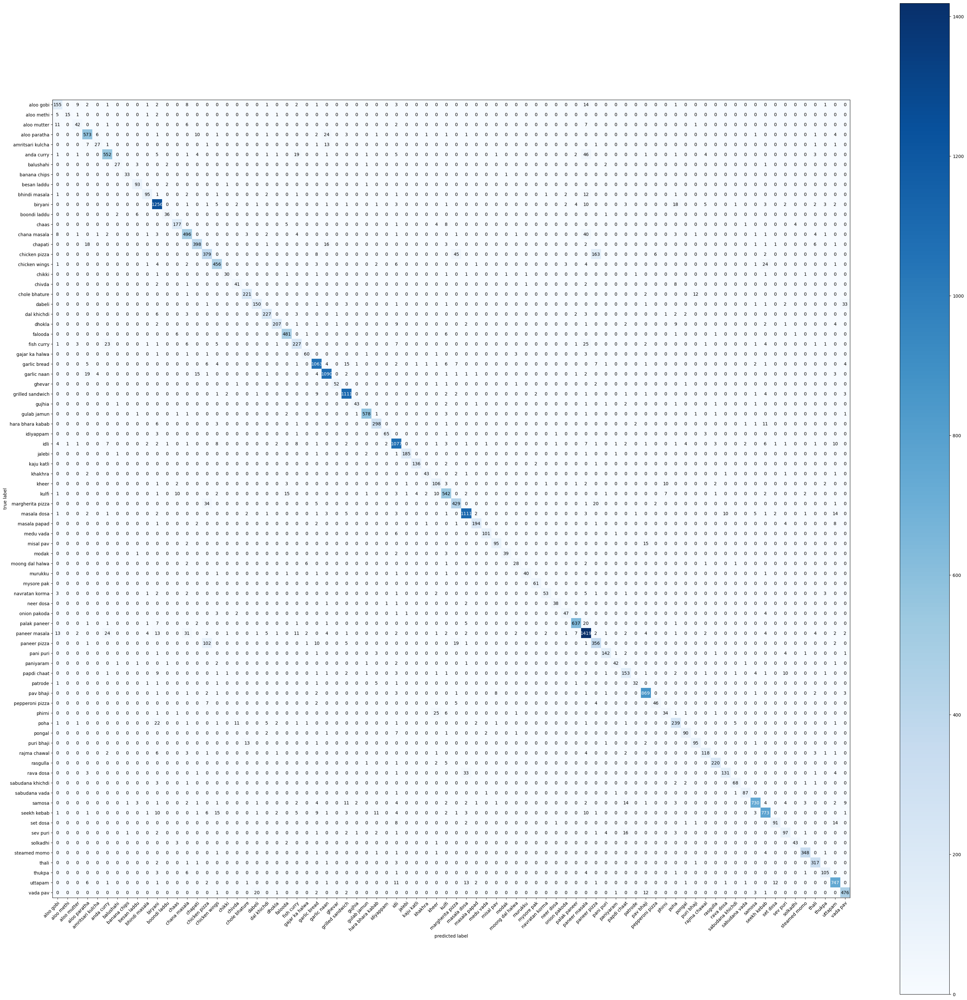

In [61]:

conf_mat=ConfusionMatrix(task='multiclass',num_classes=len(class_names))
confmat_tensor=conf_mat(preds=y_preds_ten,
                        target=y_actual_ten)
# display the matrix
plot_confusion_matrix(conf_mat=confmat_tensor.numpy(),
                      class_names=class_names,
                      figsize=(40,40), # Increased figsize for better visibility with many classes
                      colorbar=True) # Added colorbar for better interpretability


In [62]:
from torchmetrics import F1Score


f1_score_macro=F1Score(task='multiclass',
                 num_classes=len(class_names),average='macro')
f1_score_micro=F1Score(task='multiclass',
                 num_classes=len(class_names))
score_macro=f1_score_macro(preds=y_preds_ten,
               target=y_actual_ten)
score_micro=f1_score_micro(preds=y_preds_ten,
               target=y_actual_ten)


In [64]:
print(f'The macro F1 score is {score_macro}')
print(f'The micro F1 score is {score_micro}')

The macro F1 score is 0.860934317111969
The micro F1 score is 0.8943835496902466


Here, after training for few more epochs(5), the macro F1 score has improved by ~1% so a boost
I can choose one of the saved models

## Make predictions on custom image

In [1]:
# imports
import torch
from torch import nn
import torchvision

# create model function
def create_mobile_net_v3(class_names):

    # get weights
    weights_mob=torchvision.models.MobileNet_V3_Large_Weights.DEFAULT

    # create model
    model_mob=torchvision.models.mobilenet_v3_large(weights=weights_mob)

    #transforms
    transforms_mob=weights_mob.transforms()
    
    # freeze base layers except last 3 layers
    for param in model_mob.features[:-3].parameters():
        param.requires_grad=False

    # change head
    model_mob.classifier=model_mob.classifier=nn.Sequential(
    nn.Linear(in_features=960, out_features=1280, bias=True),
    nn.Hardswish(),
    nn.Dropout(p=0.2, inplace=True),
    nn.Linear(in_features=1280, out_features=len(class_names), bias=True)
    )
    return model_mob, transforms_mob

In [2]:
# class names 
class_names=['aloo gobi', 
'aloo methi',
'aloo mutter',
'aloo paratha',
'amritsari kulcha',
'anda curry',
'balushahi',
'banana chips',
'besan laddu',
'bhindi masala',
'biryani',
'boondi laddu',
'chaas',
'chana masala',
'chapati',
'chicken pizza',
'chicken wings',
'chikki',
'chivda',
'chole bhature',
'dabeli',
'dal khichdi',
'dhokla',
'falooda',
'fish curry',
'gajar ka halwa',
'garlic bread',
'garlic naan',
'ghevar',
'grilled sandwich',
'gujhia',
'gulab jamun',
'hara bhara kabab',
'idiyappam',
'idli',
'jalebi',
'kaju katli',
'khakhra',
'kheer',
'kulfi',
'margherita pizza',
'masala dosa',
'masala papad',
'medu vada',
'misal pav',
'modak',
'moong dal halwa',
'murukku',
'mysore pak',
'navratan korma',
'neer dosa',
'onion pakoda',
'palak paneer',
'paneer masala',
'paneer pizza',
'pani puri',
'paniyaram',
'papdi chaat',
'patrode',
'pav bhaji',
'pepperoni pizza',
'phirni',
'poha',
'pongal',
'puri bhaji',
'rajma chawal',
'rasgulla',
'rava dosa',
'sabudana khichdi',
'sabudana vada',
'samosa',
'seekh kebab',
'set dosa',
'sev puri',
'solkadhi',
'steamed momo',
'thali',
'thukpa',
'uttapam',
'vada pav']

In [3]:
# create model instance
model,transforms=create_mobile_net_v3(class_names)

In [9]:
# load pretrained model
model.load_state_dict(torch.load('models/MobileNetV3_100_data_15_epochs_test_acc88_with_unfreezing_3_layers.pth',map_location=torch.device('cpu'),))

<All keys matched successfully>

In [11]:
# make prediction
model.eval()
with torch.inference_mode():
    image=Image.open('biryani.jpeg')
    preprocessed_img=transforms(image).unsqueeze(0)

    prediction=model(preprocessed_img)
    pred_label=torch.softmax(prediction,dim=1).argmax(dim=1)


In [13]:
print(f'The actual label is biryani and the predicted label is {class_names[pred_label]}')

The actual label is biryani and the predicted label is biryani


In [10]:
from PIL import Image

In [ ]:
# raw logits
prediction

tensor([[ -1.2375,  -4.6266,  -4.5179,  -6.2887,  -4.7656,  -2.6148,  -7.8178,
         -14.5513,  -8.0744,  -3.4489,   5.3476,  -8.8971,  -6.1511,  -2.5039,
          -5.9200,  -1.2112,  -0.1234,  -6.1071,  -5.0024,  -9.0406,  -5.1030,
          -5.8492,  -5.0203,  -5.8181,  -1.8356,  -3.1482,  -0.3671,  -3.8041,
          -2.3240,  -4.0027,  -3.2354,  -4.7343,  -0.6195,  -7.4376,  -3.6830,
          -2.5995,  -9.6230, -11.0525,  -5.5286,  -3.4145,  -4.1422,  -4.4757,
          -4.8945, -10.5798,  -6.7483,  -8.0568,  -2.3369,  -5.8815,  -6.9489,
          -4.2086,  -8.7619,  -5.9788,  -4.8261,   0.6991,  -2.7577,  -4.8305,
         -10.5993,  -4.1622,  -4.1266,  -1.3907,  -5.3368,  -5.4967,  -2.3847,
          -9.6795, -10.5860,  -0.2690,  -9.3797,  -7.6490,  -6.1382,  -9.5985,
          -3.4009,   0.9358,  -8.5310,  -3.6249,  -9.2987,  -7.2042,  -1.9435,
          -3.4443,  -5.6230,  -7.4237]])

In [17]:
import numpy as np

In [18]:
np.argsort(prediction) #returns the indices of the elements of the array which would result in sorting the array (ascending order)

tensor([[ 7, 37, 56, 64, 43, 63, 36, 69, 66, 74, 19, 11, 50, 72,  8, 45,  6, 67,
         33, 79, 75, 48, 44,  3, 12, 68, 17, 51, 14, 47, 21, 23, 78, 38, 61, 60,
         20, 22, 18, 42, 55, 52,  4, 31,  1,  2, 41, 49, 57, 40, 58, 29, 27, 34,
         73,  9, 77, 39, 70, 30, 25, 54,  5, 35, 13, 62, 46, 28, 76, 24, 59,  0,
         15, 32, 26, 65, 16, 53, 71, 10]])

In [28]:
# but for top predictions indices, we need descending order
# therefore reverse the above and take the top 5 predictions or select the last 5 indices and reverse it
top_indices=np.argsort(prediction)[-5:].tolist()[::-1]

In [30]:
len(top_indices)

1

In [31]:
pred_prob=torch.softmax(prediction,dim=1)

In [32]:
results=[
    {
        'label':class_names[idx],
        'probability':pred_prob[idx]
    }
    for idx in top_indices
]

TypeError: list indices must be integers or slices, not list

In [33]:
pred_prob

tensor([[1.3201e-03, 4.4538e-05, 4.9652e-05, 8.4507e-06, 3.8759e-05, 3.3300e-04,
         1.8316e-06, 2.1803e-09, 1.4170e-06, 1.4462e-04, 9.5603e-01, 6.2241e-07,
         9.6981e-06, 3.7206e-04, 1.2219e-05, 1.3553e-03, 4.0220e-03, 1.0133e-05,
         3.0588e-05, 5.3923e-07, 2.7660e-05, 1.3115e-05, 3.0045e-05, 1.3530e-05,
         7.2587e-04, 1.9536e-04, 3.1522e-03, 1.0138e-04, 4.4543e-04, 8.3117e-05,
         1.7904e-04, 3.9994e-05, 2.4492e-03, 2.6789e-06, 1.1444e-04, 3.3815e-04,
         3.0118e-07, 7.2115e-08, 1.8072e-05, 1.4968e-04, 7.2298e-05, 5.1793e-05,
         3.4073e-05, 1.1570e-07, 5.3373e-06, 1.4422e-06, 4.3970e-04, 1.2699e-05,
         4.3668e-06, 6.7655e-05, 7.1256e-07, 1.1521e-05, 3.6485e-05, 9.1552e-03,
         2.8866e-04, 3.6323e-05, 1.1346e-07, 7.0865e-05, 7.3431e-05, 1.1326e-03,
         2.1893e-05, 1.8659e-05, 4.1918e-04, 2.8464e-07, 1.1497e-07, 3.4773e-03,
         3.8416e-07, 2.1683e-06, 9.8236e-06, 3.0865e-07, 1.5173e-04, 1.1601e-02,
         8.9763e-07, 1.2128e

In [34]:
pred_prob.argmax(dim=1)

tensor([10])

In [36]:
# get top 5 predictions
probs=torch.nn.functional.softmax(prediction, dim=1)
top5_probs, top5_indices=torch.topk(probs, k=5)
top5_probs=top5_probs.squeeze().tolist()
top5_indices=top5_indices.squeeze().tolist()
top5_class_names=[class_names[idx] for idx in top5_indices] 


In [37]:
top5_class_names,top5_probs

(['biryani', 'seekh kebab', 'paneer masala', 'chicken wings', 'rajma chawal'],
 [0.956025242805481,
  0.011600607074797153,
  0.009155230596661568,
  0.0040220231749117374,
  0.0034772888757288456])

In [39]:
results={
    "predictions": list(zip(top5_class_names, top5_probs))#,
    #"processing_time": end_time - start_time
}

In [40]:
results

{'predictions': [('biryani', 0.956025242805481),
  ('seekh kebab', 0.011600607074797153),
  ('paneer masala', 0.009155230596661568),
  ('chicken wings', 0.0040220231749117374),
  ('rajma chawal', 0.0034772888757288456)]}